# Main Paper Figures and Tables

In [1]:
import os
import numpy as np
import numpy.ma as ma
import pandas as pd
import iris
import matplotlib.pyplot as plt
os.environ["PROJ_LIB"] = "C:\\Utilities\\Python\\Anaconda\\Library\\share"; #fixr
from mpl_toolkits.basemap import Basemap
from mpl_toolkits.axes_grid1 import make_axes_locatable
from textwrap import wrap
from src.ploter_functions import median_correlation_plot   
from src.ploter_functions import correlation_scatter_plot     
from src.ploter_functions import difference_to_ensemble_plot   
from src.ploter_functions import rmsd_scatter_plot 
from src.ploter_functions import rmsd_scatter_plot_percentage_change 
from src.ploter_functions import totals_table  

In [2]:
results_figures_path = '/home/users/carter10/Antarctica_Climate_Variability/results/Paper_Figures/'

## Figures

### Figure 1

See data folder for boundary csvs and QGIS file. Plot was done using the Quantarctica QGIS project and adding a layer of labels. 

### Figure 2

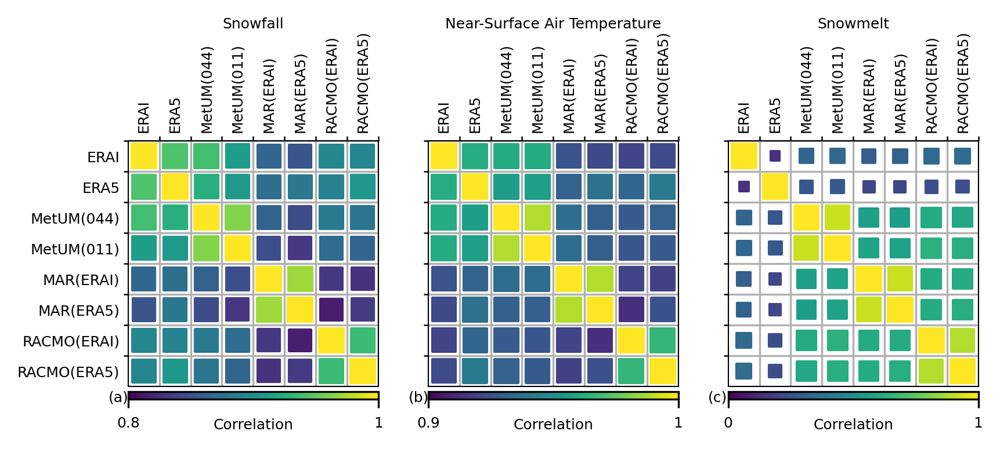

In [3]:
input_path = '/home/users/carter10/Shared_Storage/Antarctica_Climate_Variability/Ensemble_Array_Data/'
mask_path = '/home/users/carter10/Shared_Storage/Antarctica_Climate_Variability/Mask_Data/'
grid_cube_path = '/home/users/carter10/Shared_Storage/Antarctica_Climate_Variability/Postprocessed_Data/MetUM_011_ERA_INT_tas_2000.nc'
variables = ['snowfall','temperature','melt']
component = [2] # 0=Trend component, 1=Seasonal component, 2=Residual component
land_only_mask = np.load(f'{mask_path}metum011_grid_land_filter.npy')
mean_melt = np.load(f'{input_path}mean_melt.npy')
grid_cube = iris.load(grid_cube_path)[0][0]
subplot_dimensions = [1,3]

antarctica_map = Basemap(width=6000000,height=5000000,projection='laea',lat_ts=-55,lat_0=-90,lon_0=0,resolution='l')
cm = 1/2.54  # centimeters in inches
fig, ax = plt.subplots(subplot_dimensions[0], subplot_dimensions[1], sharex='col', sharey='row',figsize=(16*cm, 5.0*cm),dpi= 300)
#fig.subplots_adjust(hspace=0.01, wspace=0.0)

plt_numbers = [1,2,3]
scale=100
models = ['ERAI','ERA5','MetUM(044)','MetUM(011)','MAR(ERAI)','MAR(ERA5)', 'RACMO(ERAI)','RACMO(ERA5)']  
model_numbers = np.array([0,1,2,3,4,5,6,7])
fontsize=6
vmins = [0.8,0.9,0]
vmaxs = [1,1,1]

plots = correlation_scatter_plot(input_path,variables,component,land_only_mask,mean_melt,subplot_dimensions,plt_numbers,scale,vmins)

axes = plt.gcf().get_axes()

counter = 0
for axis in axes:
    axis.set_xticks(model_numbers)
    axis.set_xticklabels(models, rotation=90,fontsize=fontsize)
    axis.xaxis.tick_top() # setting x axis to top of graph
    
    if counter==0:
        axis = plt.gcf().get_axes()[0]
        axis.set_yticks(model_numbers)
        axis.set_yticklabels(np.flip(models),fontsize=fontsize)
    else:
        axis.set_yticks(model_numbers)
        axis.set_yticklabels([])
    axis.tick_params(which='major', length=0)

        
    axis.grid(False, 'major')
    axis.grid(True, 'minor')
    axis.set_xticks(axis.get_xticks()+0.5, minor=True)
    axis.set_yticks(axis.get_yticks()+0.5, minor=True)
    axis.set_xlim([-0.5, 7.5]) 
    axis.set_ylim([-0.5, 7.5])
        
    counter+=1
    
for plot,axis,vmin,vmax in zip(plots,axes,vmins,vmaxs):
    divider = make_axes_locatable(axis)
    cax = divider.append_axes('bottom', size='3%', pad=0.03)
    cbar = plt.colorbar(plot,cax=cax,orientation="horizontal")
    cbar.set_ticks([vmin, vmax])
    cbar.ax.set_xticklabels([f'{vmin}', f'{vmax}'],fontsize=6)
    colorbar_label = "\n".join(wrap('Correlation', 100))
    cbar.set_label(colorbar_label,labelpad=-5,fontsize=6)

label_height = .01
title_height = 1.4
for axis,label,title in zip(axes,['(a)','(b)','(c)'],['Snowfall','Near-Surface Air Temperature','Snowmelt']):
    [x.set_linewidth(0.5) for x in axis.spines.values()] #Setting border line width
    axis.set_title(title,loc='center',y=title_height,fontsize=6) # Setting column titles
    axis.annotate(label,xy=(-0.08,-0.06),xycoords='axes fraction',fontsize=6) # Setting labels

# plt.legend(*plots[-1].legend_elements("sizes", num=4),loc='center left', bbox_to_anchor=(1, 0.5),fontsize=6)

plt.show()
fig.savefig(f'{results_figures_path}fig02.png',dpi=300,bbox_inches='tight')

### Figure 3

/home/users/carter10/.conda/envs/cordex-analysis-env/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)


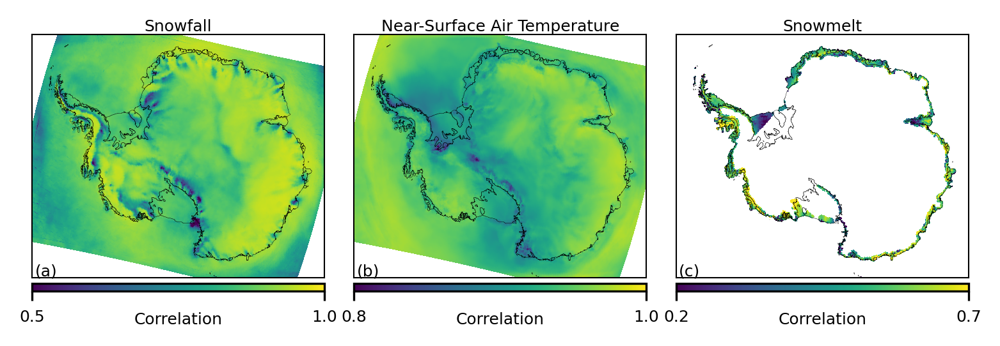

In [4]:
input_path = '/home/users/carter10/Shared_Storage/Antarctica_Climate_Variability/Ensemble_Array_Data/'
mask_path = '/home/users/carter10/Shared_Storage/Antarctica_Climate_Variability/Mask_Data/'
grid_cube_path = '/home/users/carter10/Shared_Storage/Antarctica_Climate_Variability/Postprocessed_Data/MetUM_011_ERA_INT_tas_2000.nc'
variables = ['snowfall','temperature','melt']
component = [2] # 0=Trend component, 1=Seasonal component, 2=Residual component
land_only_mask = np.load(f'{mask_path}metum011_grid_land_filter.npy')
mean_melt = np.load(f'{input_path}mean_melt.npy')
grid_cube = iris.load(grid_cube_path)[0][0]
subplot_dimensions = [1,3] # 1 row, 3 columns of plots
plt_numbers = [1,2,3]
vmins = [0.5,0.8,0.2]
vmaxs = [1.0,1.0,0.7]

antarctica_map = Basemap(width=6000000,height=5000000,projection='laea',lat_ts=-55,lat_0=-90,lon_0=0,resolution='l')
cm = 1/2.54  # centimeters in inches
fig, ax = plt.subplots(1, 3, sharex='col', sharey='row',figsize=(16*cm, 4.5*cm),dpi= 300)
fig.subplots_adjust(hspace=0.01, wspace=0.1)
       
plots = median_correlation_plot(input_path,variables,component,land_only_mask,mean_melt,antarctica_map,grid_cube,subplot_dimensions,plt_numbers,vmins,vmaxs)    

axes = plt.gcf().get_axes()

label_height = .01
title_height = 0.95
for axis,label,title in zip(axes,['(a)','(b)','(c)'],['Snowfall','Near-Surface Air Temperature','Snowmelt']):
#for axis,label,title in zip(plt.gcf().get_axes(),['a.','b.','c.'],['Near-Surface Air Temperature','Snowfall','Snowmelt']):
    [x.set_linewidth(0.5) for x in axis.spines.values()] #Setting border line width
    axis.set_title(title,loc='center',y=title_height,fontsize=6) # Setting column titles
    axis.annotate(label,xy=(0.01,label_height),xycoords='axes fraction',fontsize=6) # Setting labels

for plot,axis,vmin,vmax in zip(plots,axes,vmins,vmaxs):
    divider = make_axes_locatable(axis)
    cax = divider.append_axes('bottom', size='3%', pad=0.03)
    cbar = plt.colorbar(plot,cax=cax,orientation="horizontal")
    cbar.set_ticks([vmin, vmax])
    cbar.ax.set_xticklabels([f'{vmin}', f'{vmax}'],fontsize=6)
    colorbar_label = "\n".join(wrap('Correlation', 100))
    cbar.set_label(colorbar_label,labelpad=-5,fontsize=6)

fig.savefig(f'{results_figures_path}fig03.png',dpi=300,bbox_inches='tight')

### Figures 4,5,6

In [5]:
input_path = '/home/users/carter10/Shared_Storage/Antarctica_Climate_Variability/Ensemble_Array_Data/'
mask_path = '/home/users/carter10/Shared_Storage/Antarctica_Climate_Variability/Mask_Data/'
grid_cube_path = '/home/users/carter10/Shared_Storage/Antarctica_Climate_Variability/Postprocessed_Data/MetUM_011_ERA_INT_tas_2000.nc'
variables = ['snowfall','temperature','melt']
land_only_mask = np.load(f'{mask_path}metum011_grid_land_filter.npy')
mean_melt = np.load(f'{input_path}mean_melt.npy')
grid_cube = iris.load(grid_cube_path)[0][0]

In [6]:
models = [1,3,5,7] #[0:ERAI,1:ERA5,2:MetUM(044),3:MetUM(011),4:MAR(ERAI),5:MAR(ERA5),6:RACMO(ERAI),7:RACMO(ERA5)]
vmin=-3
vmax=3
label_xy = [.01,.02]
title_height = 0.96
row_xy = [-0.05,0.5]
col_titles = ['Mean','Seasonal Standard Deviation','Residual Standard Deviation']
row_titles = ['ERA5','MetUM(011)','MAR(ERA5)', 'RACMO(ERA5)']
labels = ['(a)','(b)','(c)','(d)','(e)','(f)','(g)','(h)','(i)','(j)','(k)','(l)']

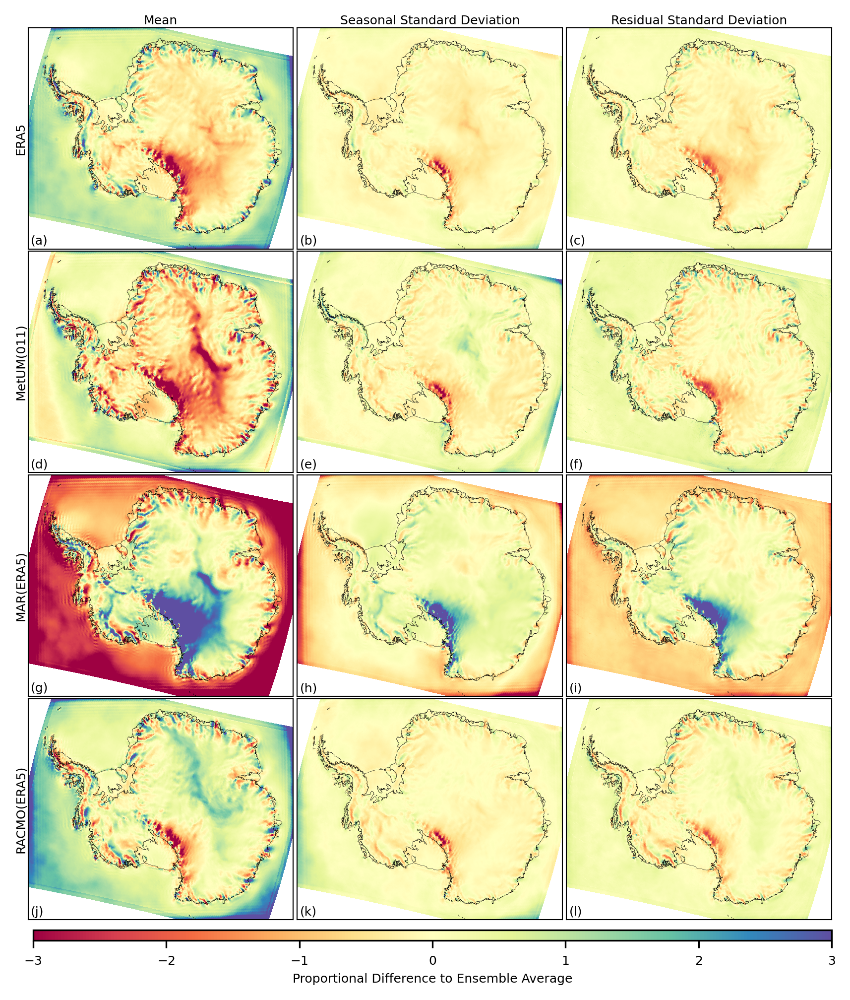

In [7]:
variable = variables[0] 

antarctica_map = Basemap(width=6000000,height=5000000,projection='laea',lat_ts=-55,lat_0=-90,lon_0=0,resolution='l')
cm = 1/2.54  # centimeters in inches
fig, ax = plt.subplots(4, 3, sharex='col',dpi= 300, sharey='row',figsize=(17.7*cm,17.7*cm))
fig.subplots_adjust(hspace=0.01, wspace=0.015)

difference_to_ensemble_plot(input_path,antarctica_map,vmin,vmax,variable,models,grid_cube,land_only_mask,mean_melt)

fig.subplots_adjust(bottom=0.02)
cax = fig.add_axes([0.13, 0.0, 0.77, 0.01]) #left,bottom,width,height
cbar = plt.colorbar(cax=cax,orientation="horizontal")
cbar.ax.tick_params(labelsize=6)

colorbar_label = "\n".join(wrap('Proportional Difference to Ensemble Average', 100))
cbar.set_label(colorbar_label,labelpad=3,fontsize=6)

for axis,label in zip(plt.gcf().get_axes(),labels):
    [x.set_linewidth(0.5) for x in axis.spines.values()] #Setting border line width
    axis.annotate(label,xy=(label_xy[0],label_xy[1]),xycoords='axes fraction',fontsize=6) # Setting labels
for axis,coltitle in zip(plt.gcf().get_axes(),col_titles):
    axis.set_title(coltitle,loc='center',y=title_height,fontsize=6) # Setting column titles
for axis,rowtitle in zip(plt.gcf().get_axes()[::3],row_titles):
    axis.annotate(rowtitle,xy=(row_xy[0],row_xy[1]),xycoords='axes fraction',fontsize=6,rotation=90,va='center') # Setting row titles
    
fig.savefig(f'{results_figures_path}fig04.png',dpi=300,bbox_inches='tight')

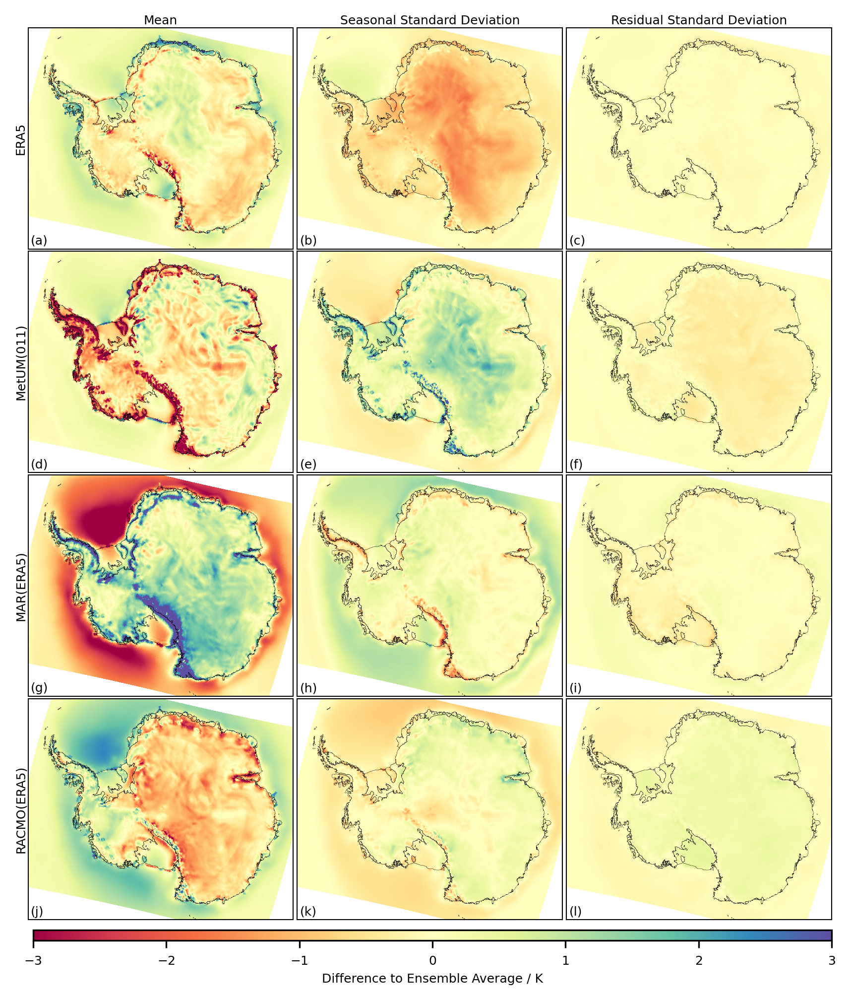

In [8]:
variable = variables[1] 

antarctica_map = Basemap(width=6000000,height=5000000,projection='laea',lat_ts=-55,lat_0=-90,lon_0=0,resolution='l')
cm = 1/2.54  # centimeters in inches
fig, ax = plt.subplots(4, 3, sharex='col',dpi= 300, sharey='row',figsize=(17.7*cm,17.7*cm))
fig.subplots_adjust(hspace=0.01, wspace=0.015)

difference_to_ensemble_plot(input_path,antarctica_map,vmin,vmax,variable,models,grid_cube,land_only_mask,mean_melt)

fig.subplots_adjust(bottom=0.02)
cax = fig.add_axes([0.13, 0.0, 0.77, 0.01]) #left,bottom,width,height
cbar = plt.colorbar(cax=cax,orientation="horizontal")
cbar.ax.tick_params(labelsize=6)

colorbar_label = "\n".join(wrap('Difference to Ensemble Average / K', 100))
cbar.set_label(colorbar_label,labelpad=3,fontsize=6)

for axis,label in zip(plt.gcf().get_axes(),labels):
    [x.set_linewidth(0.5) for x in axis.spines.values()] #Setting border line width
    axis.annotate(label,xy=(label_xy[0],label_xy[1]),xycoords='axes fraction',fontsize=6) # Setting labels
for axis,coltitle in zip(plt.gcf().get_axes(),col_titles):
    axis.set_title(coltitle,loc='center',y=title_height,fontsize=6) # Setting column titles
for axis,rowtitle in zip(plt.gcf().get_axes()[::3],row_titles):
    axis.annotate(rowtitle,xy=(row_xy[0],row_xy[1]),xycoords='axes fraction',fontsize=6,rotation=90,va='center') # Setting row titles
    
fig.savefig(f'{results_figures_path}fig05.png',dpi=300,bbox_inches='tight')

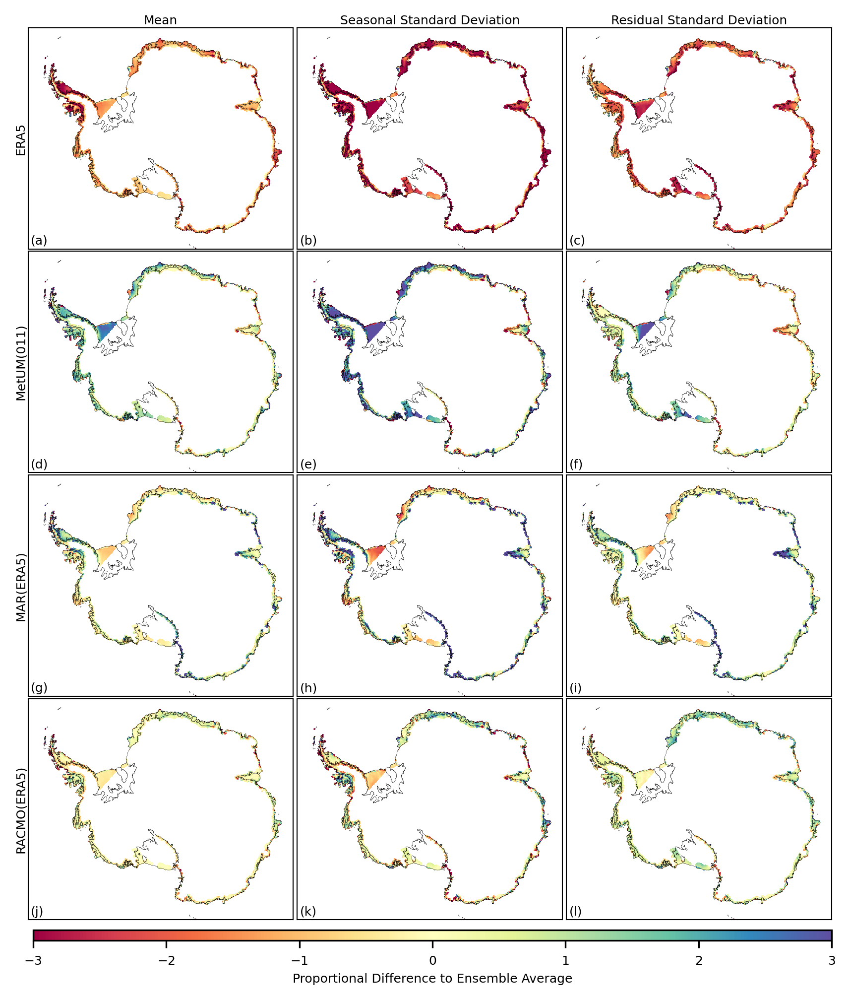

In [9]:
variable = variables[2] 

antarctica_map = Basemap(width=6000000,height=5000000,projection='laea',lat_ts=-55,lat_0=-90,lon_0=0,resolution='l')
cm = 1/2.54  # centimeters in inches
fig, ax = plt.subplots(4, 3, sharex='col',dpi= 300, sharey='row',figsize=(17.7*cm,17.7*cm))
fig.subplots_adjust(hspace=0.01, wspace=0.015)

difference_to_ensemble_plot(input_path,antarctica_map,vmin,vmax,variable,models,grid_cube,land_only_mask,mean_melt)

fig.subplots_adjust(bottom=0.02)
cax = fig.add_axes([0.13, 0.0, 0.77, 0.01]) #left,bottom,width,height
cbar = plt.colorbar(cax=cax,orientation="horizontal")
cbar.ax.tick_params(labelsize=6)

colorbar_label = "\n".join(wrap('Proportional Difference to Ensemble Average', 100))
cbar.set_label(colorbar_label,labelpad=3,fontsize=6)

for axis,label in zip(plt.gcf().get_axes(),labels):
    [x.set_linewidth(0.5) for x in axis.spines.values()] #Setting border line width
    axis.annotate(label,xy=(label_xy[0],label_xy[1]),xycoords='axes fraction',fontsize=6) # Setting labels
for axis,coltitle in zip(plt.gcf().get_axes(),col_titles):
    axis.set_title(coltitle,loc='center',y=title_height,fontsize=6) # Setting column titles
for axis,rowtitle in zip(plt.gcf().get_axes()[::3],row_titles):
    axis.annotate(rowtitle,xy=(row_xy[0],row_xy[1]),xycoords='axes fraction',fontsize=6,rotation=90,va='center') # Setting row titles
    
fig.savefig(f'{results_figures_path}fig06.png',dpi=300,bbox_inches='tight')

### Figure 7

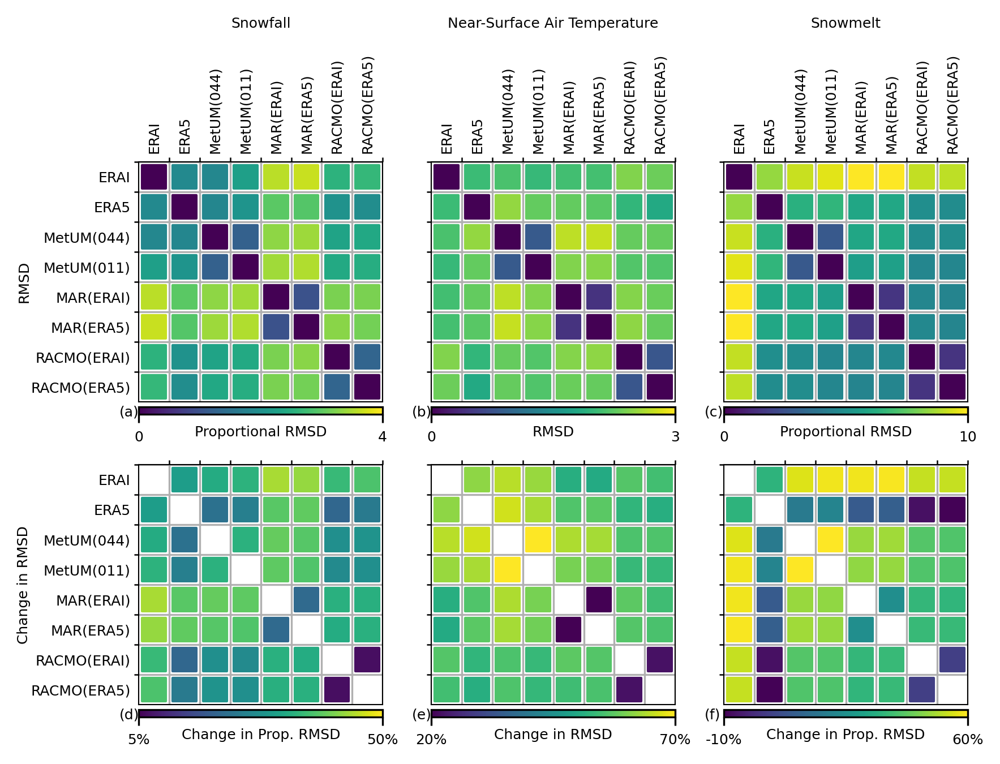

In [10]:
input_path = '/home/users/carter10/Shared_Storage/Antarctica_Climate_Variability/Ensemble_Array_Data/'
mask_path = '/home/users/carter10/Shared_Storage/Antarctica_Climate_Variability/Mask_Data/'
variables = ['snowfall','temperature','melt']
land_only_mask = np.load(f'{mask_path}metum011_grid_land_filter.npy')
mean_melt = np.load(f'{input_path}mean_melt.npy')
subplot_dimensions = [2,3]

cm = 1/2.54  # centimeters in inches
fig, ax = plt.subplots(subplot_dimensions[0], subplot_dimensions[1], sharex='col', sharey='row',figsize=(16*cm, 11.0*cm),dpi= 300)
#fig.subplots_adjust(hspace=0.4, wspace=0.6)

scale=100
models = ['ERAI','ERA5','MetUM(044)','MetUM(011)','MAR(ERAI)','MAR(ERA5)', 'RACMO(ERAI)','RACMO(ERA5)']  
model_numbers = np.array([0,1,2,3,4,5,6,7])
fontsize=6

plots = []
plt_numbers_list = [[1,2,3],[4,5,6]]
vmins_list = [[0,0,0],[0.05,0.2,-0.1]]
vmaxs_list = [[4,3,10],[0.5,0.7,0.6]]

plots.append(rmsd_scatter_plot(input_path,variables,land_only_mask,mean_melt,subplot_dimensions,plt_numbers_list[0],scale,vmins_list[0],vmaxs_list[0]))
plots.append(rmsd_scatter_plot_percentage_change(input_path,variables,land_only_mask,mean_melt,subplot_dimensions,plt_numbers_list[1],scale,vmins_list[1],vmaxs_list[1]))

axes = plt.gcf().get_axes()

counter = 0
for axis in axes:
    axis.set_xticks(model_numbers)
    axis.set_xticklabels([])
    axis.xaxis.tick_top() # setting x axis to top of graph
    axis.set_yticks(model_numbers)
    axis.set_yticklabels([])
    
    if counter in [0,3,6]:
        axis.set_yticklabels(np.flip(models),fontsize=fontsize)
    if counter in [0,1,2]:
        axis.set_xticklabels(models, rotation=90,fontsize=fontsize)
        
    axis.tick_params(which='major', length=0)
    axis.grid(False, 'major')
    axis.grid(True, 'minor')
    axis.set_xticks(axis.get_xticks()+0.5, minor=True)
    axis.set_yticks(axis.get_yticks()+0.5, minor=True)
    axis.set_xlim([-0.5, 7.5]) 
    axis.set_ylim([-0.5, 7.5])
        
    counter+=1
    
plots = [item for sublist in plots for item in sublist]
vmins_list = [item for sublist in vmins_list for item in sublist]
vmaxs_list = [item for sublist in vmaxs_list for item in sublist]
colorbar_labels = ['Proportional RMSD','RMSD','Proportional RMSD','Change in Prop. RMSD','Change in RMSD','Change in Prop. RMSD']

counter=0
for plot,axis,vmin,vmax,colorbar_label in zip(plots,axes,vmins_list,vmaxs_list,colorbar_labels):
    divider = make_axes_locatable(axis)
    cax = divider.append_axes('bottom', size='3%', pad=0.03)
    cbar = plt.colorbar(plot,cax=cax,orientation="horizontal")
    cbar.set_ticks([vmin, vmax])
    colorbar_label = "\n".join(wrap(colorbar_label, 100))
    cbar.set_label(colorbar_label,labelpad=-8,fontsize=6)
    if counter >= 3:
        cbar.ax.set_xticklabels([f'{round(vmin*100)}%', f'{round(vmax*100)}%'],fontsize=6)
    else:
        cbar.ax.set_xticklabels([f'{vmin}', f'{vmax}'],fontsize=6)
    counter+=1

title_height = 1.5
for axis,label in zip(axes,['(a)','(b)','(c)','(d)','(e)','(f)']):
    [x.set_linewidth(0.5) for x in axis.spines.values()] #Setting border line width
    axis.annotate(label,xy=(-0.08,-0.06),xycoords='axes fraction',fontsize=6) # Setting labels
for axis,title in zip(axes,['Snowfall','Near-Surface Air Temperature','Snowmelt']):
    axis.set_title(title,loc='center',y=title_height,fontsize=6)#,weight='bold') # Setting column titles
row_xy = [-0.5,0.5]    
for axis,rowtitle in zip(plt.gcf().get_axes()[::3],['RMSD','Change in RMSD']):
    axis.annotate(rowtitle,xy=(row_xy[0],row_xy[1]),xycoords='axes fraction',fontsize=6,rotation=90,va='center')#,weight='bold') # Setting row titles

plt.show()
fig.savefig(f'{results_figures_path}fig07.png',dpi=300,bbox_inches='tight')

## Tables

### Table 1

\begin{table*}
\footnotesize
\begin{tabular}{|c|c|c|c|c|c|} 
\hline
\textbf{RCM/Reanalysis Dataset} & \textbf{Domain} & \textbf{Driving Data} & \textbf{H.Resolution [km]} & \textbf{Label} \\
\hline
ERA-Interim & Global & -  &  79 & ERAI \\
\hline 
ERA5        & Global & -  &  31 & ERA5 \\
\hline 
MetUMv11.1 & Antarctica & ERA-Interim  &  12 & MetUM(011) \\
\hline 
MetUMv11.1 & Antarctica & ERA-Interim  &  49 & MetUM(044) \\
\hline 
MARv3.10 & Antarctica & ERA-Interim  &  35 & MAR(ERAI) \\
\hline
MARv3.10 & Antarctica & ERA5  &  35 & MAR(ERA5) \\
\hline
RACMOv2.3p2 & Antarctica & ERA-Interim  &  27 & RACMO(ERAI) \\
\hline
RACMOv2.3p2 & Antarctica & ERA5  &  27 & RACMO(ERA5) \\
\hline
\end{tabular}
\vspace{1em}
\captionof{table}{The two reanalysis datasets and six RCM simulation outputs compared in the paper. The label with which each simulation is referred to in the paper is given.}
\label{table:RCM_simulations}
\end{table*}

### Table 2

In [11]:
input_path = '/home/users/carter10/Shared_Storage/Antarctica_Climate_Variability/Ensemble_Array_Data/'
variables = ['temperature','snowfall','melt']
totals_table(input_path,variables)

Totals:temperature


,ERAI,ERA5,MetUM(044),MetUM(011),MAR(ERAI),MAR(ERA5),RACMO(ERAI),RACMO(ERA5),Average
Monthly Mean,-32.6,-33.3,-34.2,-33.9,-32.2,-32.2,-34.0,-33.8,-33.3
Trend Standard Deviation,0.4,0.4,0.4,0.4,0.4,0.4,0.4,0.5,0.4
Seasonal Standard Deviation,9.0,7.7,9.3,9.2,8.7,8.6,8.8,8.7,8.7
Residual Standard Deviation,1.1,1.1,1.0,1.0,1.0,1.0,1.2,1.2,1.1


Totals:snowfall


,ERAI,ERA5,MetUM(044),MetUM(011),MAR(ERAI),MAR(ERA5),RACMO(ERAI),RACMO(ERA5),Average
Monthly Mean,179.3,225.8,212.4,222.8,234.9,235.6,229.6,231.3,221.5
Trend Standard Deviation,7.1,9.8,9.6,9.8,8.7,8.8,8.6,9.1,8.9
Seasonal Standard Deviation,25.9,34.1,26.8,25.8,38.7,38.8,30.1,31.0,31.4
Residual Standard Deviation,21.8,28.3,28.3,28.9,26.3,26.3,28.0,28.2,27.0


Totals:melt


,ERAI,ERA5,MetUM(044),MetUM(011),MAR(ERAI),MAR(ERA5),RACMO(ERAI),RACMO(ERA5),Average
Monthly Mean,15.5,1.1,13.2,14.2,11.9,12.1,9.3,9.1,10.8
Trend Standard Deviation,2.4,0.4,3.0,3.1,3.3,3.1,2.9,2.7,2.6
Seasonal Standard Deviation,29.3,2.0,25.8,27.0,23.1,23.4,18.5,18.2,20.9
Residual Standard Deviation,5.3,0.8,6.8,6.9,7.0,6.8,7.1,6.7,5.9


\begin{table}
\footnotesize
\setlength{\tabcolsep}{4pt}
\begin{tabular}{c|cccccccc|c}
\textbf{Snowfall / GT} & ERAI & ERA5 & MetUM(044) &MetUM(011) & MAR(ERAI) & MAR(ERA5) & RACMO(ERAI) & RACMO(ERA5) & Average\\
\hline
Monthly Mean & 179.3 & 225.8 &       212.4 &       222.8 &      234.9 &      235.6 &        229.6 &        231.3 & 221.5\\
Trend St.D. &  7.1 &   9.8 &         9.6 &         9.8 &        8.7 &        8.8 &          8.6 &          9.1 & 8.9\\
Seasonal St.D. & 25.9 &  34.1 &        26.8 &        25.8 &       38.7 &       38.8 &         30.1 &         31.0 & 31.4\\
Residual St.D. & 21.8 &  28.3 &        28.3 &        28.9 &       26.3 &       26.3 &         28.0 &         28.2 & 27.0\\
\textbf{Temperature / K} & ERAI & ERA5 & MetUM(044) &MetUM(011) & MAR(ERAI) & MAR(ERA5) & RACMO(ERAI) & RACMO(ERA5) & Average\\
\hline
Monthly Mean & -32.6 & -33.3 &       -34.2 &       -33.9 &      -32.2 &      -32.2 &        -34.0 &        -33.8 & -33.3\\
Trend St.D. & 0.4 &   0.4 &         0.4 &         0.4 &        0.4 &        0.4 &          0.4 &          0.5 & 0.4\\
Seasonal St.D. & 9.0 &   7.7 &         9.3 &         9.2 &        8.7 &        8.6 &          8.8 &          8.7 & 8.7\\
Residual St.D. & 1.1 &   1.1 &         1.0 &         1.0 &        1.0 &        1.0 &          1.2 &          1.2 & 1.1\\
\textbf{Melt / GT} & ERAI & ERA5 & MetUM(044) &MetUM(011) & MAR(ERAI) & MAR(ERA5) & RACMO(ERAI) & RACMO(ERA5) & Average\\
\hline
Monthly Mean & 15.5 &   1.1 &        13.2 &        14.2 &       11.9 &       12.1 &          9.3 &          9.1 & 10.8\\
Trend St.D. &  2.4 &   0.4 &         3.0 &         3.1 &        3.3 &        3.1 &          2.9 &          2.7 & 2.6\\
Seasonal St.D. & 29.3 &   2.0 &        25.8 &        27.0 &       23.1 &       23.4 &         18.5 &         18.2 & 20.9\\
Residual St.D. &  5.3 &   0.8 &         6.8 &         6.9 &        7.0 &        6.8 &          7.1 &          6.7 & 5.9\\
\end{tabular}
\captionof{table}{After aggregating across the ice sheet, the mean in the monthly time series and standard deviation for each component of the monthly time series for total snowfall, average near-surface air temperature and total melt are given. Values for snowfall and melt are expressed in units of gigatonnes while values for temperature are expressed in Kelvin.}
\label{table:Totals}
\end{table}